# Results visualisation notebook

Use this notebook to visualise results generated from `scripts/run_eval.py`. Set the following variables:

In [1]:
%cd ..

c:\Users\s2558406\Documents\Repos\cmr-experiments


c:\Users\s2558406\Documents\Repos\cmr-experiments\venv\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
from pathlib import Path
RESULTS_FILE = Path('M:/models/cmr-experiments/CMRxRecon/DynamicMRI/eval_test_table_1_seed_1')
RESULTS_FILE = Path('results/eval_test_table_1_seed_1')

In [3]:
import json
from py_markdown_table.markdown_table import markdown_table
from itertools import zip_longest

def isnotNone(x): return x is not None and x != ""
def filt(lbl): return [results[id].get(lbl, "") for id in results.keys()]

with open(RESULTS_FILE.with_suffix(".json"), "r") as f:
    results = json.load(f)

In [4]:
titles, metrics, metrics_init = filt('title'), filt('metrics'), filt('metrics_init')

titles = ["No learning"] + titles
metrics = [metrics_init[-1]] + metrics #0 here arbitrary as all the same

In [5]:
data = [{
    "Method": title,
    "PSNR(norm)": round(metric[0], 2),
    "RescaleMinMaxPSNR": round(metric[1], 2),
    "MaxPixelPSNR": round(metric[2], 2),
    "MSE": round(metric[3], 5),
    "NMSE": round(metric[4], 5),
    "SSIM": round(metric[5], 4),
    "RescaleMinMaxSSIM": round(metric[6], 4),
    "MaxPixelSSIM": round(metric[7], 4),
} for title, metric in zip_longest(titles, metrics)]

print(markdown_table(data).set_params(row_sep="markdown").get_markdown())

```|   Method  |PSNR(norm)|RescaleMinMaxPSNR|MaxPixelPSNR|  MSE  |  NMSE | SSIM |RescaleMinMaxSSIM|MaxPixelSSIM|
|-----------|----------|-----------------|------------|-------|-------|------|-----------------|------------|
|No learning|   2.29   |      28.16      |    28.0    |0.50585|0.50585| 0.304|      0.7904     |   0.6828   |
|     mc    |   2.29   |      28.16      |    28.0    |0.50585|0.50585| 0.304|      0.7904     |   0.6828   |
|   t-ssdu  |   4.32   |      30.81      |    18.83   |4.35682|4.35682|0.1073|      0.8963     |   0.5091   |
| ei-rotate |    5.8   |      31.32      |    30.84   |0.27071|0.27071|0.2352|      0.9249     |    0.793   |
|    ddei   |   8.93   |      35.55      |    33.94   |0.13592|0.13592|0.3731|      0.9592     |   0.8798   |
|    sup    |   10.82  |      37.51      |    35.8    |0.08758|0.08758|0.4012|      0.9702     |   0.8881   |```


In [17]:
import numpy as np
import torch
import deepinv as dinv

data = np.load((Path("results") / RESULTS_FILE.name).with_suffix(".npz"))
if "table_1" in RESULTS_FILE.name:
    data_2 = np.load((Path("results") / (RESULTS_FILE.name + "_supp")).with_suffix(".npz"))

def get_data(k):
    if k == "mask":
        vis = data["y"] != 0
    else:
        try:
            vis = data[k]
        except KeyError:
            vis = data_2[k]
    k = k.replace("t-ssdu-mc_esi", "t-ssdu*")
    vis = torch.tensor(vis)
    vis = torch.clamp(vis, -10, 10)
    vis = vis[..., 128:512-128, :] #crop to square of interest
    return k, vis

def _plot_videos(*labels):
    titles, xs = list(zip(*[get_data(k) for k in labels]))
    return dinv.utils.plot_videos(xs, titles=titles, display=True, figsize=(2*len(labels), 2*len(xs[0])))

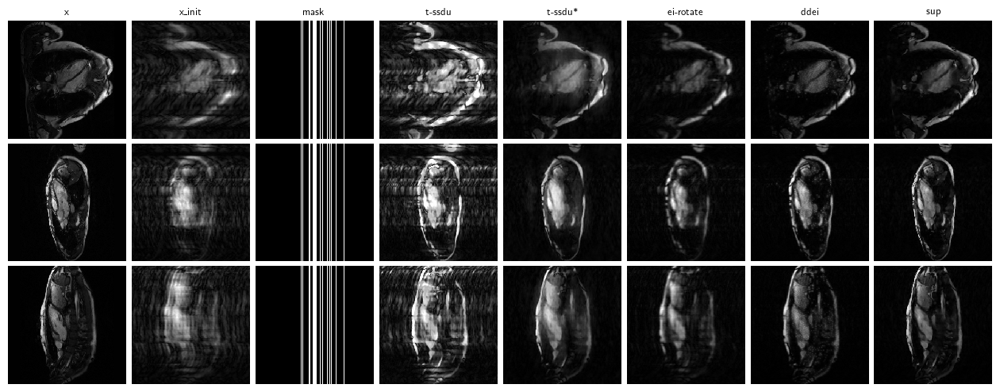

In [18]:
#| column: screen
#| out-width: 100%

_plot_videos("x", "x_init", "mask", "t-ssdu", "t-ssdu-mc_esi", "ei-rotate", "ddei", "sup")